In [ ]:
import torch
import torchvision
from torchvision import transforms
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
!pip install timm==0.6.13
import timm
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
! unzip "/content/drive/My Drive/Finetuning_Artwork_models/Dataset_arte_fake.zip"

In [ ]:
! unzip "/content/drive/My Drive/Finetuning_Artwork_models/Dataset_arte_vera.zip"

In [ ]:
#Inserire i due folder(real e fake) in una nuova cartella
import os
import shutil

fake_dir = 'Dataset_arte_fake'
real_dir = 'Dataset_arte_vera'

os.mkdir("Artworks")

shutil.move(fake_dir,'Artworks')
shutil.move(real_dir,'Artworks')

In [ ]:
import pandas as pd

# Creazione del dataframe contenente il path degli artwork e l'autenticità

path = 'Artworks' 

data = [] # Crea una lista vuota per immagazinare i percorsi degli artwork e le etichette (real o fake)

# Cicla la cartella degli artwork falsi e aggiunge il percorso e l'etichetta alla lista "data"

for dirpath, dirnames, filenames in os.walk(os.path.join(path,fake_dir)):
    for filename in filenames:
        if filename.endswith(".jpg"): # only consider jpg files
            filepath = os.path.join(dirpath, filename)
            data.append((filepath, "0"))


# Cicla la cartella degli artwork veri e aggiunge il percorso e l'etichetta alla lista "data"

for filename in os.listdir(os.path.join(path,real_dir)):
    if filename.endswith(".jpg"): 
       filepath = os.path.join(path,real_dir,filename)
       data.append((filepath,"1"))

# Converte la lista "data" in un dataframe pandas
df = pd.DataFrame(data, columns=["path", "label"])

In [ ]:
from sklearn.model_selection import train_test_split

df['label'] = df['label'].astype(int)

# Dividi il dataset in due parti (training + validation e test)
train_val_data, test = train_test_split(df.values, test_size=0.1, random_state=1)

for file_path, label in test:
    print(file_path)

In [ ]:
def preprocess_image(image_path,model_name):
    img = Image.open(image_path)
    if model_name == 'vgg19':            
       preprocess = transforms.Compose([
           transforms.Resize(256),
           transforms.CenterCrop(256),
           transforms.ToTensor(),
           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
       ])
    else:
       preprocess = transforms.Compose([
           transforms.Resize(224),
           transforms.CenterCrop(224),
           transforms.ToTensor(),
           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))                         
    ])
    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor.to(device)

In [ ]:
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.model.eval()
        

    def save_gradient(self, grad):
        self.gradients = grad

    def forward(self, x):
        self.model.zero_grad()
        x.requires_grad_()
        out = self.model(x)
        return out

    def generate_cam(self, image_tensor, target_class):
        output = self.forward(image_tensor)
        one_hot_output = torch.zeros((1, output.size()[-1]), dtype=torch.float)
        one_hot_output[0][target_class] = 1
        one_hot_output= one_hot_output.to(device)
        output.backward(gradient=one_hot_output)
        gradients = self.gradients.detach().cpu().numpy()
        feature_maps = self.model.feature_maps.detach().cpu().numpy()
        cam_weights = np.mean(gradients, axis=(2, 3))[0, :]
        cam = np.zeros(feature_maps.shape[2:], dtype=np.float32)

        for i, weight in enumerate(cam_weights):
            cam += weight * feature_maps[0, i, :, :]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (224, 224))
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)

        return cam

In [ ]:
def register_hooks(model, grad_cam):
    def forward_hook(module, input, output):
        grad_cam.model.feature_maps = output

    def backward_hook(module, grad_input, grad_output):
        grad_cam.save_gradient(grad_output[0])

    for name, module in model.named_modules():
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            target_module = module      
    target_module.register_forward_hook(forward_hook)
    target_module.register_backward_hook(backward_hook)

In [ ]:
def apply_grad_cam(image_path, model, grad_cam,model_name):

    # Carica ed effettua il preprocessing dell'immagine
    image_tensor = preprocess_image(image_path,model_name)
    

    # Registra gli hooks per Grad-CAM
    register_hooks(model, grad_cam)
    

    # Ottiene la predizione dal modello
    with torch.no_grad():
        output = model(image_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        top_prob, top_class = probabilities.topk(1, dim=1)

    # Generazione di Grad-CAM
    cam = grad_cam.generate_cam(image_tensor, top_class.item())

    
    # Carica l'immagine originale e sovrappone Grad-CAM
    original_image = cv2.imread(image_path)
    original_image = cv2.resize(original_image, (224, 224))
    cam_heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    cam_heatmap = cv2.cvtColor(cam_heatmap, cv2.COLOR_BGR2RGB)
    overlayed_image = cv2.addWeighted(original_image, 0.5, cam_heatmap, 0.5, 0)

    return top_class.item(), top_prob.item(), cam_heatmap, overlayed_image


In [ ]:
def visualize_results(image_path, model, grad_cam,model_name):   
    
    top_class, top_prob, cam_heatmap, overlayed_image = apply_grad_cam(image_path, model, grad_cam,model_name)
    labels=["fake","real"]
    class_label = labels[top_class]
    
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    print(model_name,'\n')
    ax[0].imshow(Image.open(image_path))
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    ax[1].imshow(cam_heatmap)
    ax[1].axis('off')
    ax[1].set_title('Grad-CAM Heatmap')

    ax[2].imshow(overlayed_image)
    ax[2].axis('off')
    ax[2].set_title(f'Overlayed Image (Class: {class_label}, Prob: {top_prob:.4f})')

    plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50 = torch.load('/content/drive/My Drive/Finetuning_Artwork_models/Modelli/RealArt_vs_FakeArt_resnet50.pt', map_location=device)
vgg19 = torch.load('/content/drive/My Drive/Finetuning_Artwork_models/Modelli/RealArt_vs_FakeArt_vgg19.pt', map_location=device)
vit = torch.load('/content/drive/My Drive/Finetuning_Artwork_models/Modelli/RealArt_vs_FakeArt_vit_small_patch16_224.pt', map_location=device)
resnet50 = resnet50.to(device)
vgg19 = vgg19.to(device)
vit = vit.to(device)
resnet50.eval()
vgg19.eval()
vit.eval()

In [ ]:
def Output_grad_cam(image_path):
    grad_cam = GradCAM(resnet50)
    visualize_results(image_path, resnet50, grad_cam,"resnet50")
    grad_cam = GradCAM(vgg19)
    visualize_results(image_path, vgg19, grad_cam,"vgg19")
    grad_cam = GradCAM(vit)
    visualize_results(image_path, vit, grad_cam,"vit")

Artwork veri

resnet50 



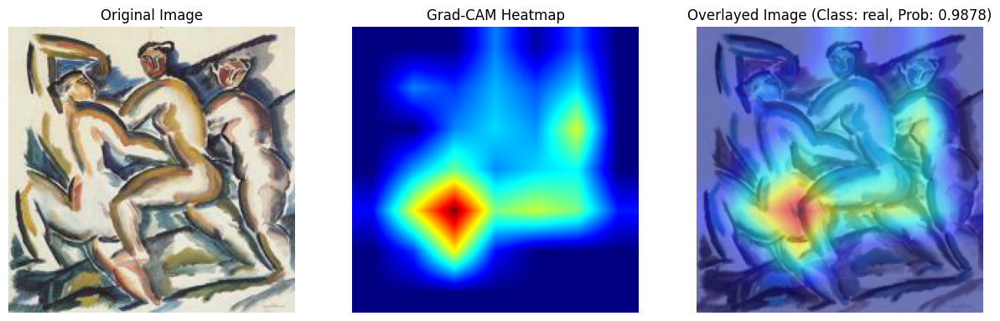

vgg19 



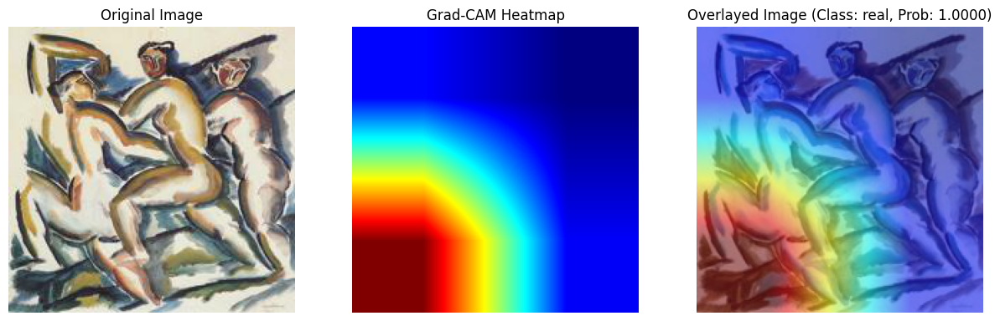

vit 



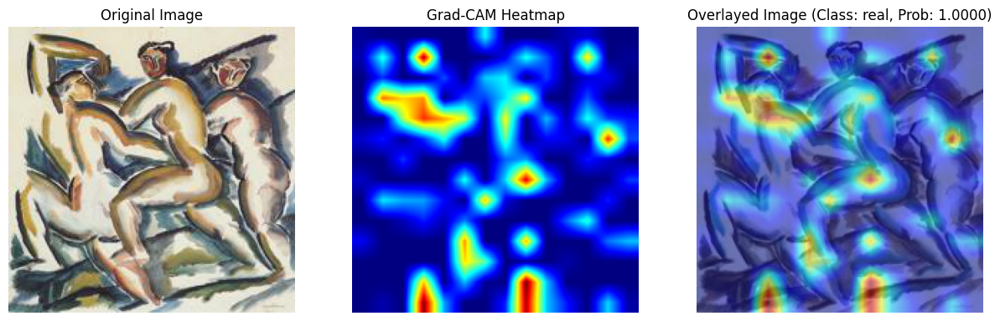

In [ ]:
image_path = 'Artworks/Dataset_arte_vera/ossip-zadkine_study-of-women.jpg'
Output_grad_cam(image_path)

resnet50 



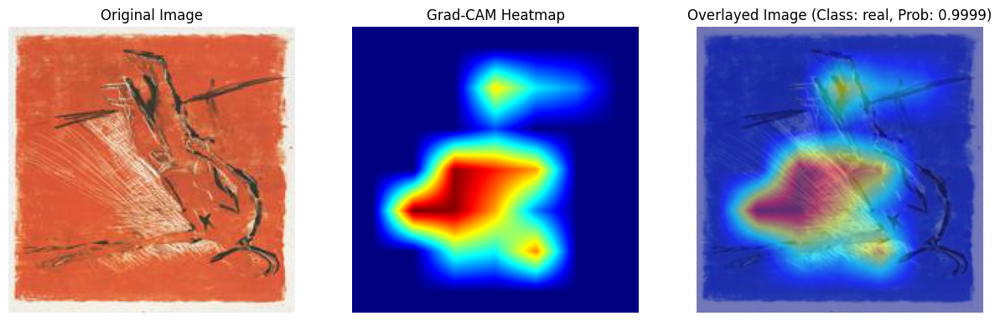

vgg19 



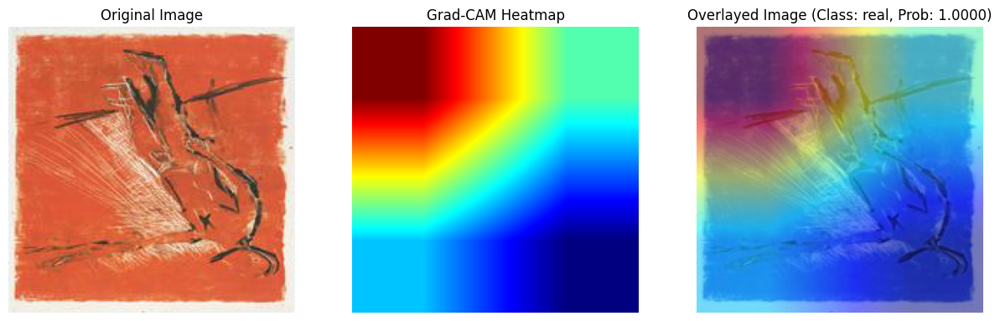

vit 



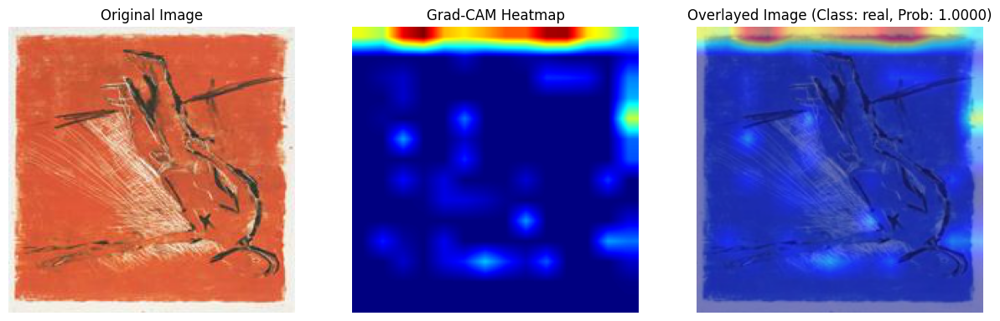

In [ ]:
image_path = 'Artworks/Dataset_arte_vera/georg-baselitz_nude-with-three-arms-1977.jpg'
Output_grad_cam(image_path)

resnet50 



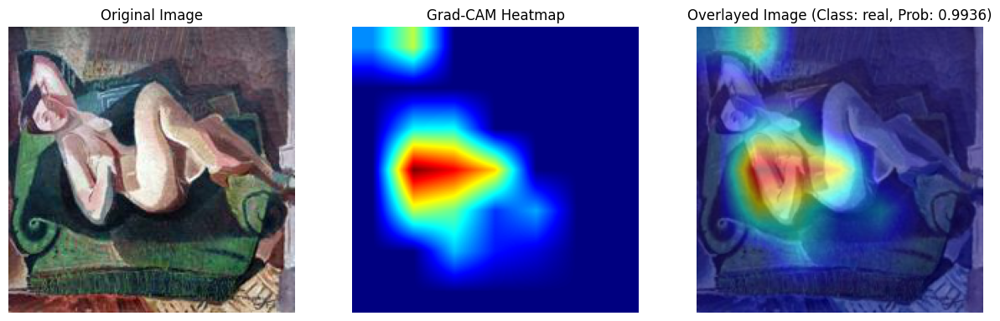

vgg19 



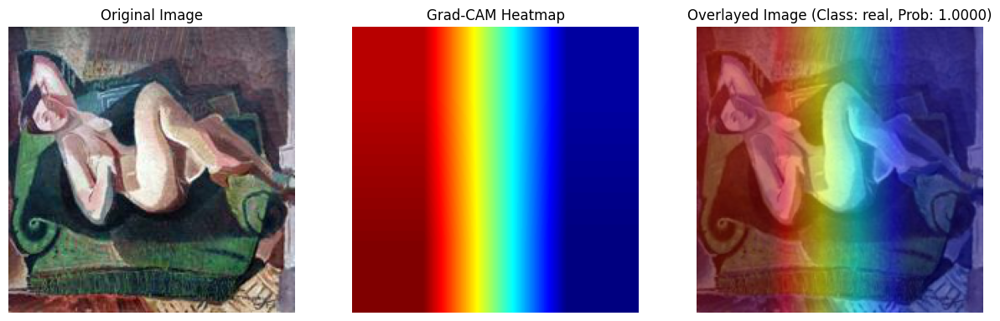

vit 



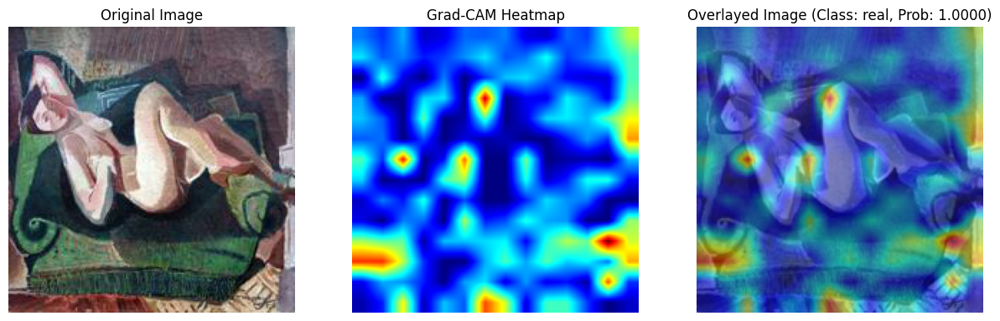

In [ ]:
image_path = 'Artworks/Dataset_arte_vera/m-h-maxy_nude-on-green-sofa-1928.jpg'
Output_grad_cam(image_path)

resnet50 



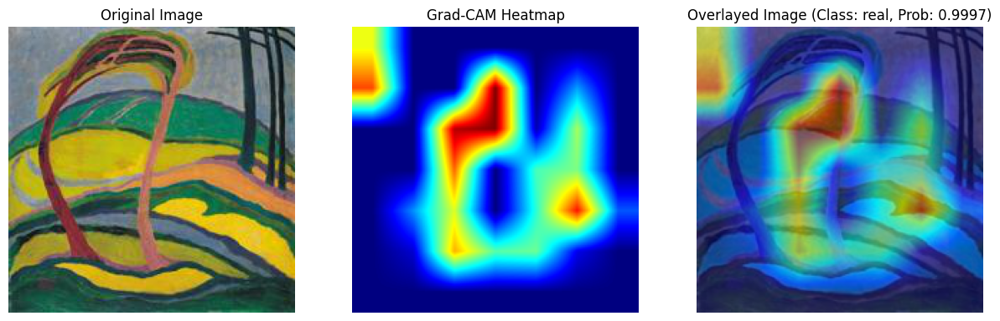

vgg19 



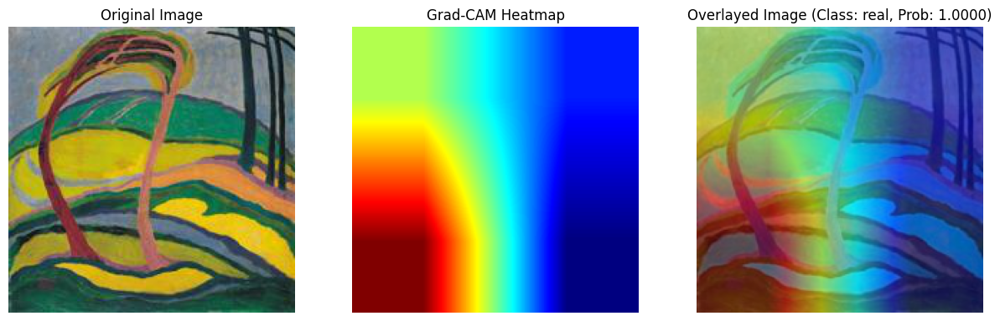

vit 



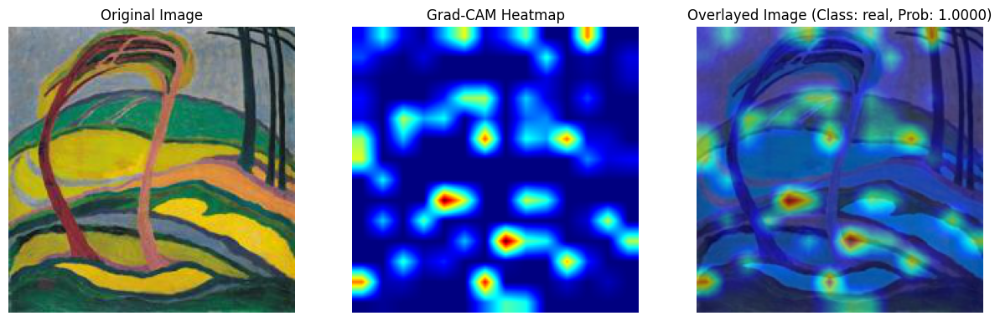

In [ ]:
image_path = 'Artworks/Dataset_arte_vera/janos-mattis-teutsch_landscape-1917-2.jpg'
Output_grad_cam(image_path)


resnet50 



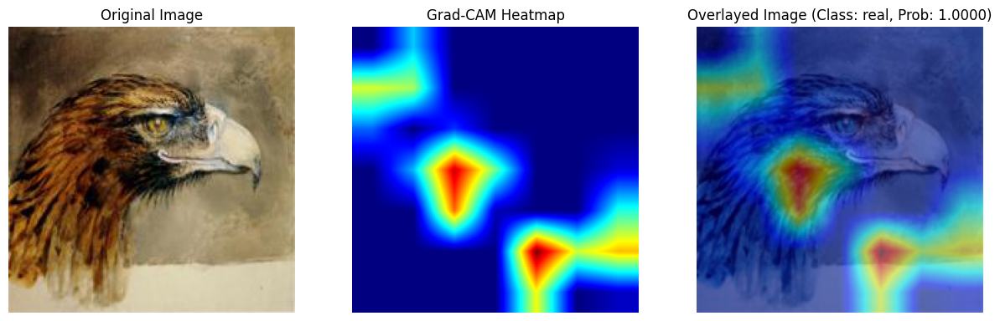

vgg19 



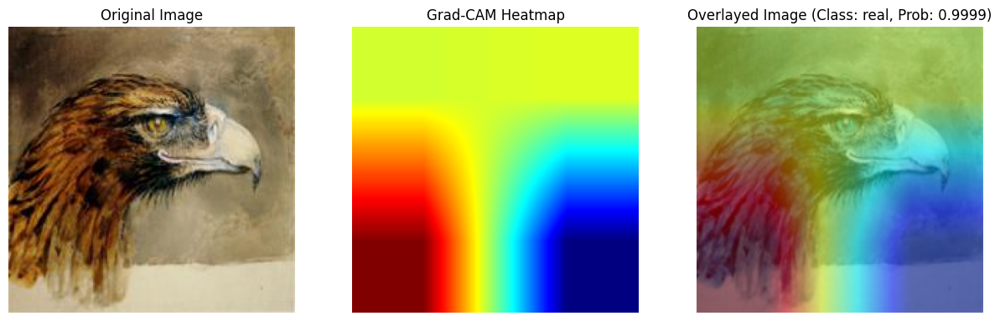

vit 



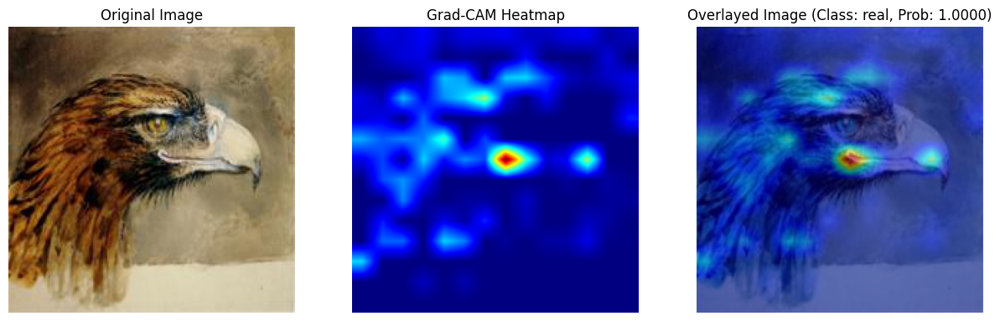

In [ ]:
image_path = 'Artworks/Dataset_arte_vera/john-ruskin_eagle-s-head-from-life-1870.jpg'
Output_grad_cam(image_path)

Artwork Fake

resnet50 



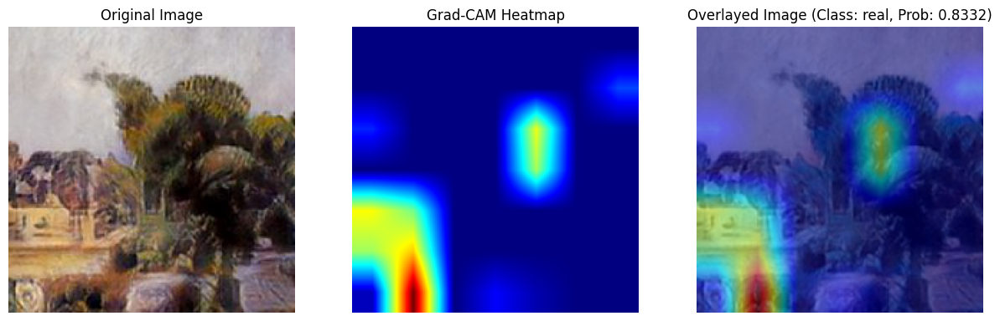

vgg19 



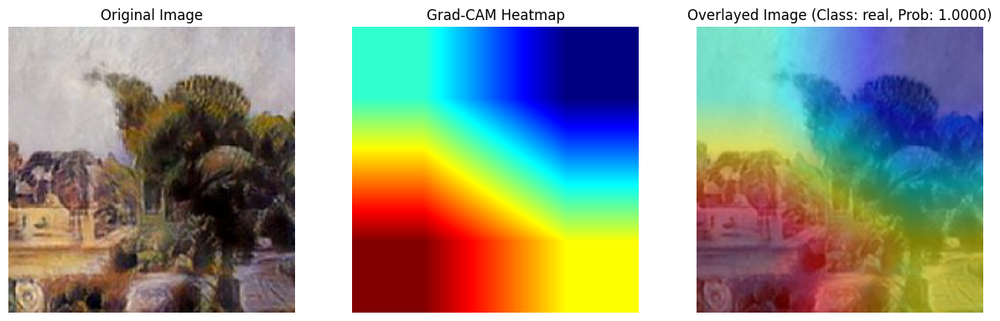

vit 



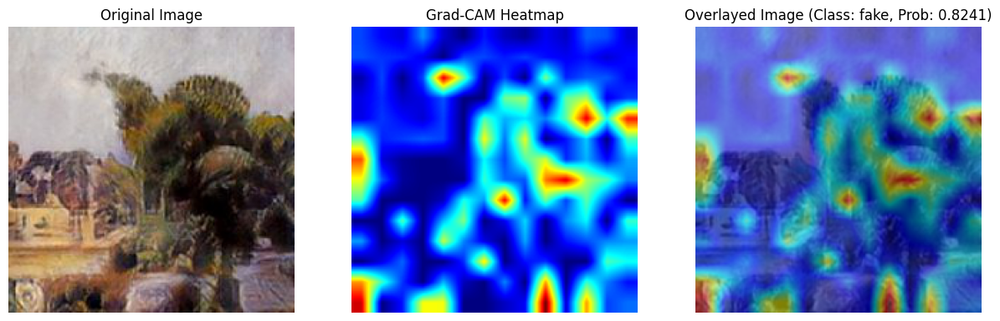

In [ ]:
image_path = 'Artworks/Dataset_arte_fake/art_painting/img000605.jpg'
Output_grad_cam(image_path)

resnet50 



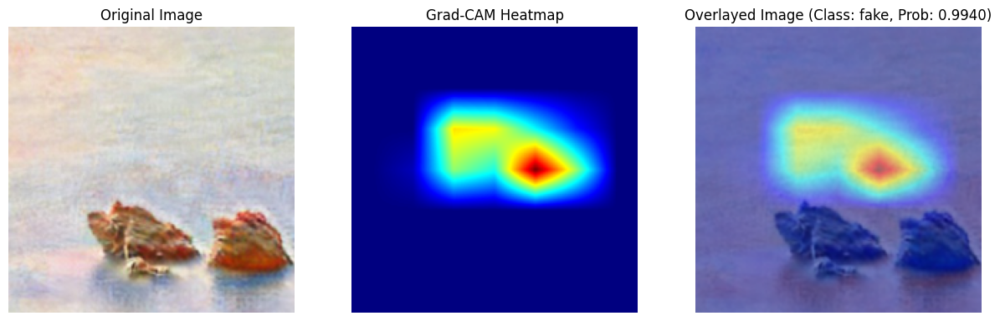

vgg19 



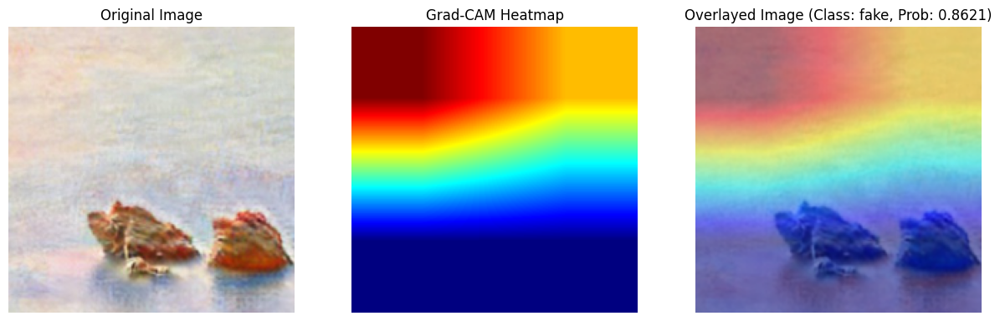

vit 



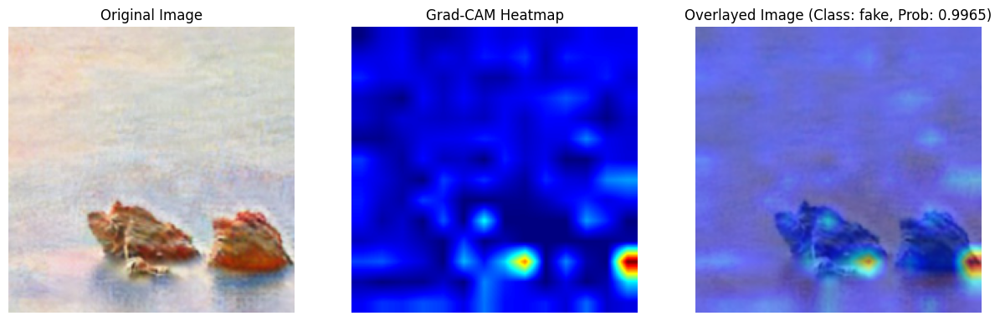

In [ ]:
image_path = 'Artworks/Dataset_arte_fake/photo2monet/img014475.jpg'
Output_grad_cam(image_path)

resnet50 



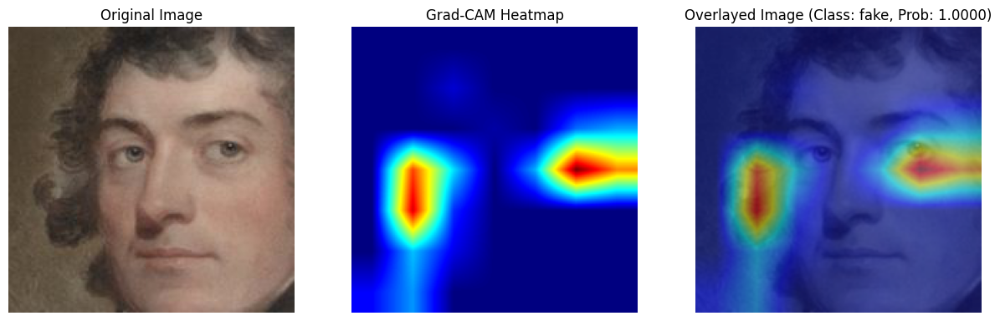

vgg19 



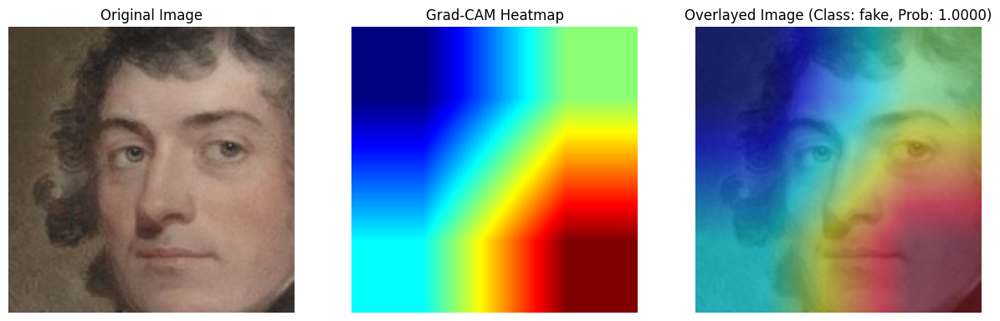

vit 



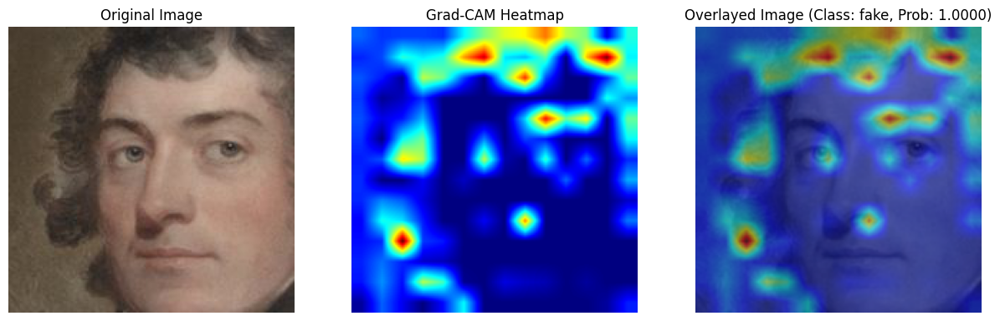

In [ ]:
image_path = 'Artworks/Dataset_arte_fake/stylegan3-2/stylegan3-r-metfaces-1024x1024/img000524.jpg'
Output_grad_cam(image_path)

resnet50 



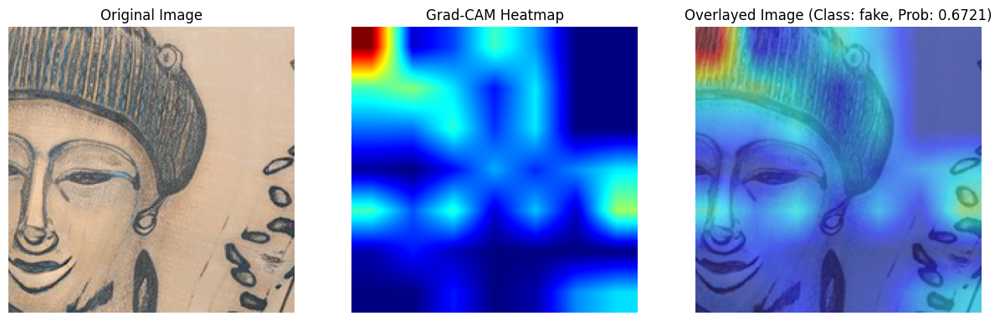

vgg19 



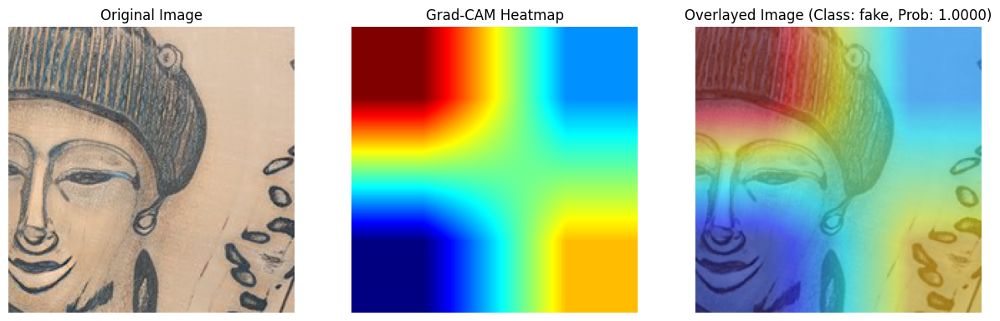

vit 



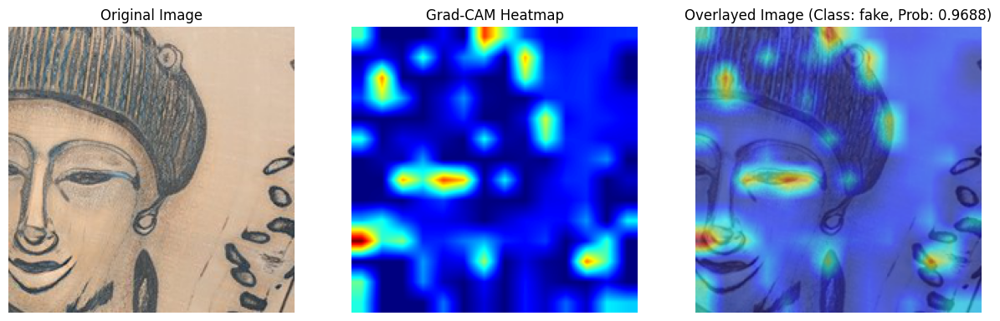

In [ ]:
image_path = 'Artworks/Dataset_arte_fake/stylegan3-r-metfacesu-1024x1024/img002059.jpg'
Output_grad_cam(image_path)

resnet50 



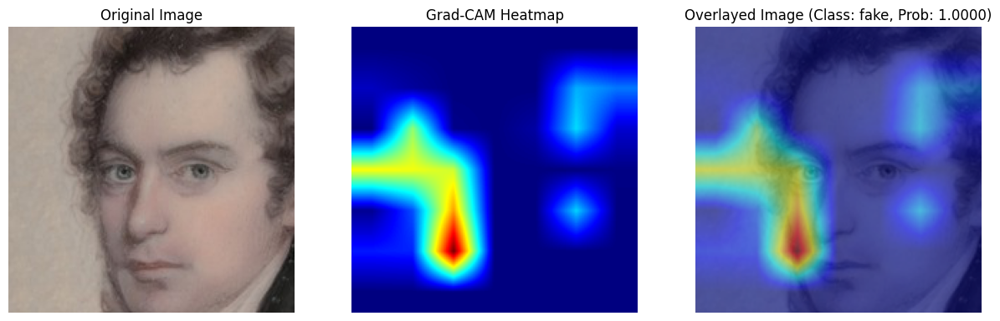

vgg19 



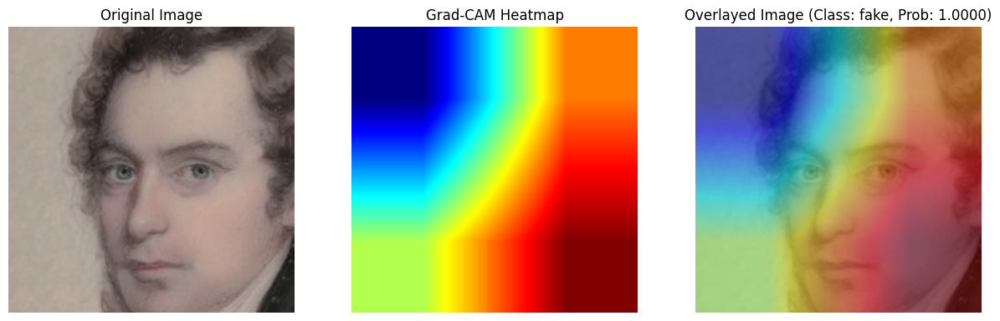

vit 



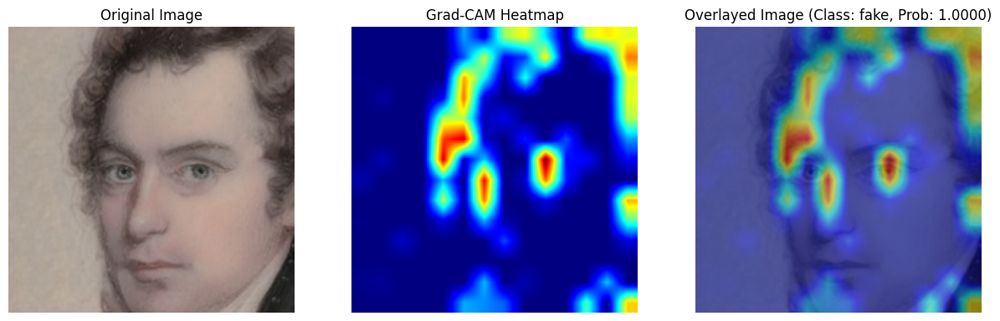

In [ ]:
image_path = 'Artworks/Dataset_arte_fake/stylegan3-t-metfaces-1024x1024/img003020.jpg'
Output_grad_cam(image_path)